In [2]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

In [3]:
# reshaped = reshaped[np.random.randint(5000)]
#To reconstruct the 12 lead ecg from the array
lead_order = ['I', 'II', 'III', 'aVR', 'aVL', 'aVF', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6']
# plt.rcParams["figure.figsize"] = [16,9]
# fig, axs = plt.subplots(len(lead_order))
def ecg_plot(array,labels):
    for i in range(0,10):
        plt.rcParams["figure.figsize"] = [16,9]
        fig, axs = plt.subplots(len(lead_order))
        a=np.random.randint(len(array))
        print("Label Value:",labels[a])
        if array.shape[1:3] == (2500, 12):
            for i in range(0,12):
                axs[i].plot(array[a][:,i])
                axs[i].set(ylabel=str(lead_order[i]))
        elif array.shape[1:3] == (12, 2500):
            for i in range(0,12):
                axs[i].plot(array[a][i,:])
                axs[i].set(ylabel=str(lead_order[i]))
        elif array.shape[1:] == (1,2500,12):
            for i in range(0,12):
                axs[i].plot(array[a][0][:,i])
                axs[i].set(ylabel=str(lead_order[i]))
        else:
            print("ECG shape not valid: ",array.shape)\
            
            
def ecg_plot_mini(array,labels):
    for i in range(0,4):
        plt.rcParams["figure.figsize"] = [8,6]
        fig, axs = plt.subplots(len(lead_order))
        assert array.shape[1:] == (1,500,12), 'correct size' #data should originally be of shape (X,1,2500,12) with downsampling by factor of 5
#         a=np.random.randint(len(array))
        a=i
        print("Label Value:",labels[a])
        for i in range(0,12):
            axs[i].plot(array[a][0][:,i])
            axs[i].set(ylabel=str(lead_order[i]))

In [10]:
train_array = np.load('/data/ValveNet/57k_train_df_pace_removed_poor_quality_removed_any_patient_negative_as_features_5_sigma_robust_normalization.npy')
eval_array = np.load('/data/ValveNet/29k_eval_df_pace_removed_poor_quality_removed_any_patient_negative_as_features_5_sigma_robust_normalization_SHUFFLED.npy')


In [11]:
train_labels = pd.read_csv('/data/ValveNet/57k_train_df_pace_removed_poor_quality_removed_any_patient_negative_as_tabular_metadata_DEIDENTIFIED.csv')
eval_labels = pd.read_csv('/data/ValveNet/29k_eval_df_pace_removed_poor_quality_removed_any_patient_negative_as_tabular_metadata_DEIDENTIFIED_SHUFFLED.csv')

Label Value: 0
Label Value: 0


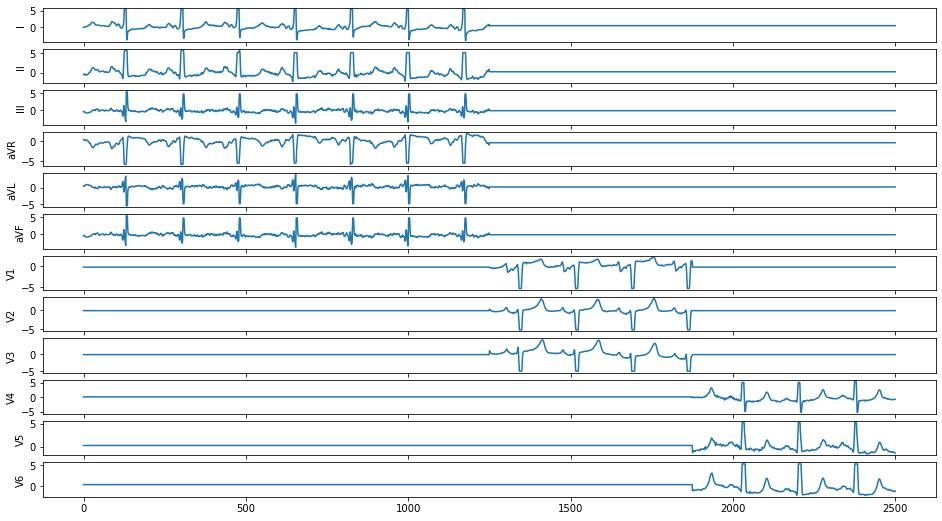

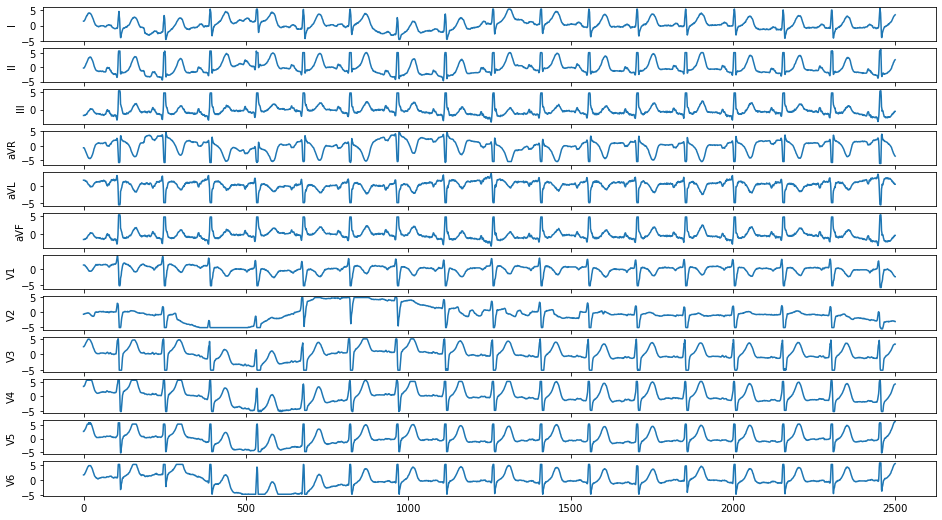

In [12]:
lead_order = ['I', 'II', 'III', 'aVR', 'aVL', 'aVF', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6']
array = eval_array
labels  = eval_labels['stenosis_label_binary']
for j in range(17596,17598):
    plt.rcParams["figure.figsize"] = [16,9]
    fig, axs = plt.subplots(len(lead_order))
    a=j
    print("Label Value:",labels[a])
    if array.shape[1:3] == (2500, 12):
        for i in range(0,12):
            axs[i].plot(array[a][:,i])
            axs[i].set(ylabel=str(lead_order[i]))
    elif array.shape[1:3] == (12, 2500):
        for i in range(0,12):
            axs[i].plot(array[a][i,:])
            axs[i].set(ylabel=str(lead_order[i]))
    elif array.shape[1:] == (1,2500,12):
        for i in range(0,12):
            axs[i].plot(array[a][0][:,i])
            axs[i].set(ylabel=str(lead_order[i]))
    else:
        print("ECG shape not valid: ",array.shape)

In [13]:
flat_ecg = eval_array[17596:17598] #2 ECGs, one iwth flatlines and the otherwithout

In [14]:
# Returns the maximum repeating character in a given string 
def maxRepeating(str): 
  
    n = len(str) 
    count = 0
    res = str[0] 
    cur_count = 1
  
    # Traverse string except  
    # last character 
    for i in range(n): 
          
        # If current character  
        # matches with next 
        if (i < n - 1 and 
            str[i] == str[i + 1]): 
            cur_count += 1
  
        # If doesn't match, update result 
        # (if required) and reset count 
        else: 
            if cur_count > count: 
                count = cur_count 
                res = str[i] 
            cur_count = 1
    return res,count 

In [24]:
for j in range(len(flat_ecg)):
    a=j
    sum_count=0
    for i in range(0,12):
        res,count=maxRepeating(pd.Series(flat_ecg[a][0][:,i]))
        print(res,count)

0.42155672467287203 1250
0.22483025315886507 1250
-0.1686226898691488 1250
-0.40469445568595713 1250
0.1686226898691488 1250
-0.1686226898691488 1250
-0.2997736708784868 1250
-0.11241512657943253 1250
-0.04817791139118537 1250
0.11241512657943253 1875
0.24526936708239827 1875
0.3372453797382976 1875
-0.0843113449345744 11
0.5995473417569736 10
-0.1686226898691488 9
-5.4046944556859575 11
0.1686226898691488 9
-0.1686226898691488 9
-0.2997736708784868 22
-5.112415126579433 117
4.9518220886088145 12
5.529081793246099 16
5.245269367082399 12
-4.662754620261702 41


In [51]:
# Returns the maximum repeating character in a given string 
def maxRepeating(str): 
  
    n = len(str) 
    count = 0
    res = str[0] 
    cur_count = 1
  
    # Traverse string except  
    # last character 
    for i in range(n): 
          
        # If current character  
        # matches with next 
        if (i < n - 1 and 
            str[i] == str[i + 1]): 
            cur_count += 1
  
        # If doesn't match, update result 
        # (if required) and reset count 
        else: 
            if cur_count > count: 
                count = cur_count 
                res = str[i] 
            cur_count = 1
    return res,count 

#function to find ecgs with long lengths of the same value, or flatlines
#initial evaluation showed flatlines do not always lay on 0, so instead we look for long repeating values 
def find_flatlines(ecg_waveform_arrays, value_length:2250, flatline_list):
    assert ecg_waveform_arrays.shape[1:] == (1,2500,12), "array is not shape (X,1,2500,12)"
    for j in range(len(ecg_waveform_arrays)):
        a=j
        sum_count=0
        if a%1000==0:
            print(a,'ECGs converted')
        for i in range(0,12): #find the longest string of a repeating value per lead, then add that to sum_count
            res,count=maxRepeating(ecg_waveform_arrays[a][0][:,i])
            sum_count+=count
            # print(res,sum_count)
            if i == 11: #when evaluating the 12th lead of the ecg, look at the sum_count
                #default is 2250 based on premise that an ecg with 3 seconds of flatline on at least 3 ecgs should be removed
                #because ecgs are 250 Hz, so 3 seconds * 250 = 750, * 3 leads = 2250
                if sum_count > value_length:
                    flatline_list.append(1)
                else:
                    flatline_list.append(0)

In [50]:
import time
#run with res,count=maxRepeating(ecg_waveform_arrays[a][0][:,i])
start = time.time()
flatline_list = []
find_flatlines(flat_ecg,2250,flatline_list)
print(flatline_list)
end = time.time()
print(end - start)

0 ECGs converted
1 ECGs converted
[1, 0]
0.02968454360961914


In [47]:
import time
#run with res,count=maxRepeating(pd.Series(ecg_waveform_arrays[a][0][:,i]))
start = time.time()
flatline_list = []
find_flatlines(flat_ecg,2250,flatline_list)
print(flatline_list)
end = time.time()
print(end - start)

[1, 0]
0.39153194427490234


In [53]:
start = time.time()
flatline_list = []
find_flatlines(eval_array,2250,flatline_list)
end = time.time()
print(end - start)

0 ECGs converted
1000 ECGs converted
2000 ECGs converted
3000 ECGs converted
4000 ECGs converted
5000 ECGs converted
6000 ECGs converted
7000 ECGs converted
8000 ECGs converted
9000 ECGs converted
10000 ECGs converted
11000 ECGs converted
12000 ECGs converted
13000 ECGs converted
14000 ECGs converted
15000 ECGs converted
16000 ECGs converted
17000 ECGs converted
18000 ECGs converted
19000 ECGs converted
20000 ECGs converted
21000 ECGs converted
22000 ECGs converted
23000 ECGs converted
24000 ECGs converted
25000 ECGs converted
26000 ECGs converted
27000 ECGs converted
28000 ECGs converted
396.61029839515686


In [54]:
len(eval_array)-len(flatline_list)

0

In [55]:
eval_labels['flatline_present'] = flatline_list

In [106]:
no_flatlines = np.array(eval_labels.index[eval_labels['flatline_present'] == 0])
all_flatlines = np.array(eval_labels.index[eval_labels['flatline_present'] == 1])
eval_labels_flatline = eval_labels[eval_labels['flatline_present'] == 1]
eval_labels_no_flatline = eval_labels[eval_labels['flatline_present'] == 0]

In [93]:
# eval_labels.iloc[indices]
print(len(all_flatlines))
eval_array[all_flatlines].shape

367


(367, 1, 2500, 12)

Label Value: 0
Label Value: 0
Label Value: 1
Label Value: 1
Label Value: 0
Label Value: 0
Label Value: 0
Label Value: 0
Label Value: 0
Label Value: 0
Label Value: 0
Label Value: 0
Label Value: 0
Label Value: 0
Label Value: 0
Label Value: 0
Label Value: 0
Label Value: 0
Label Value: 0
Label Value: 0


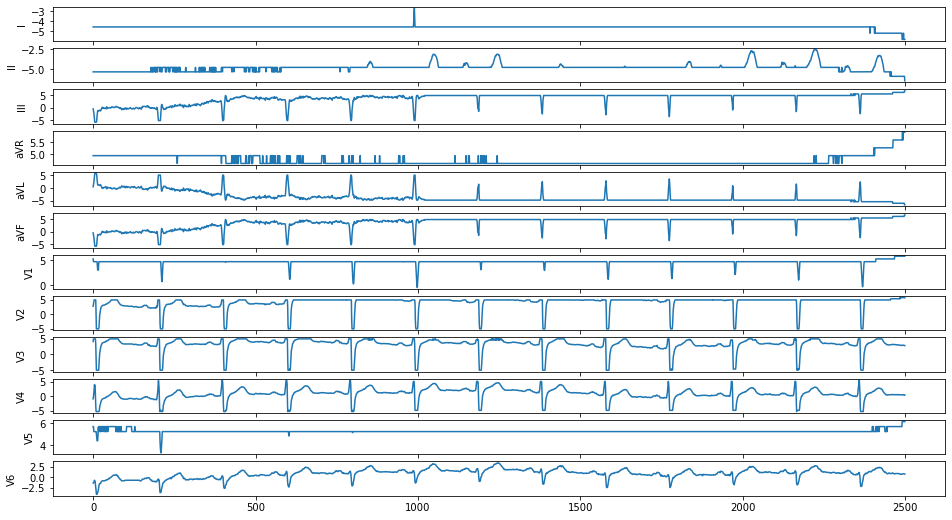

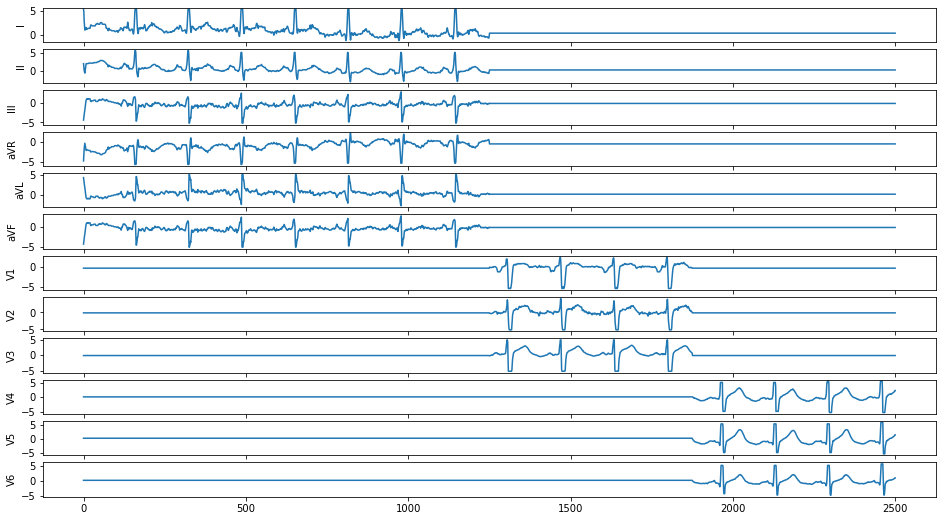

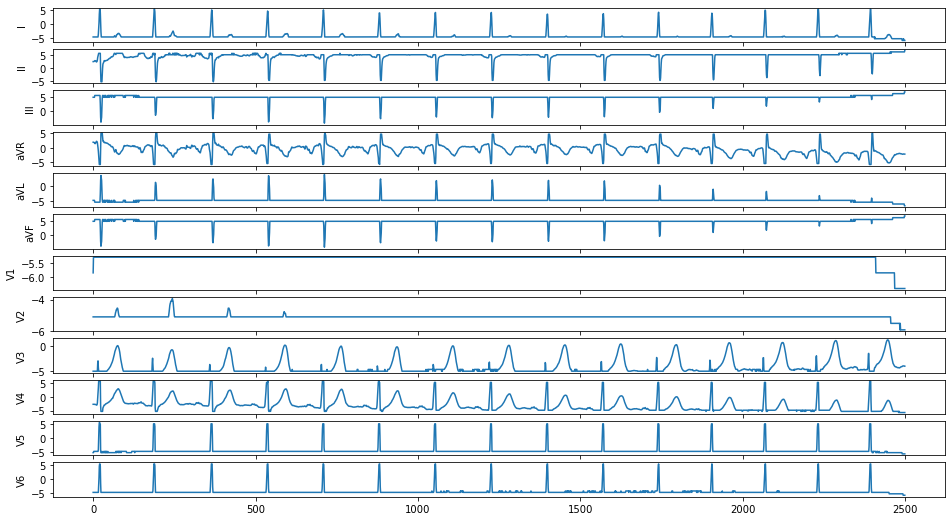

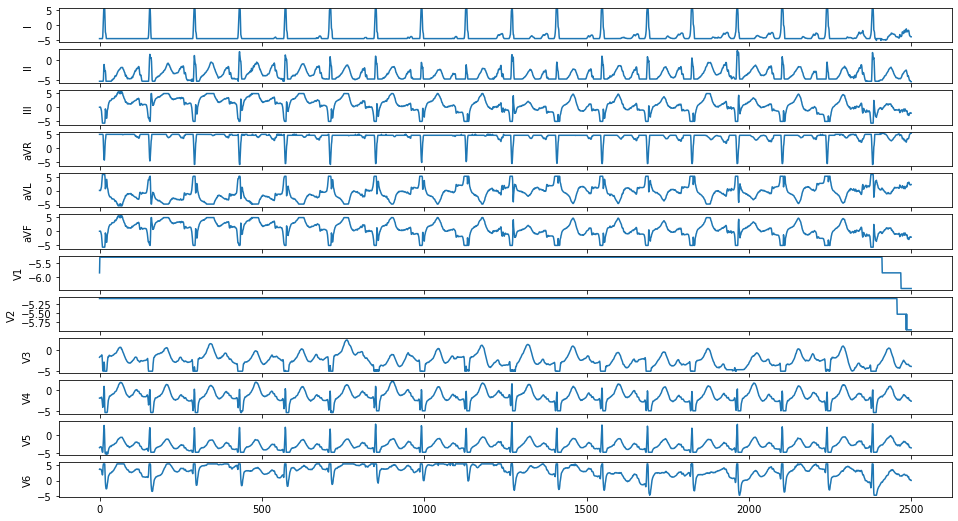

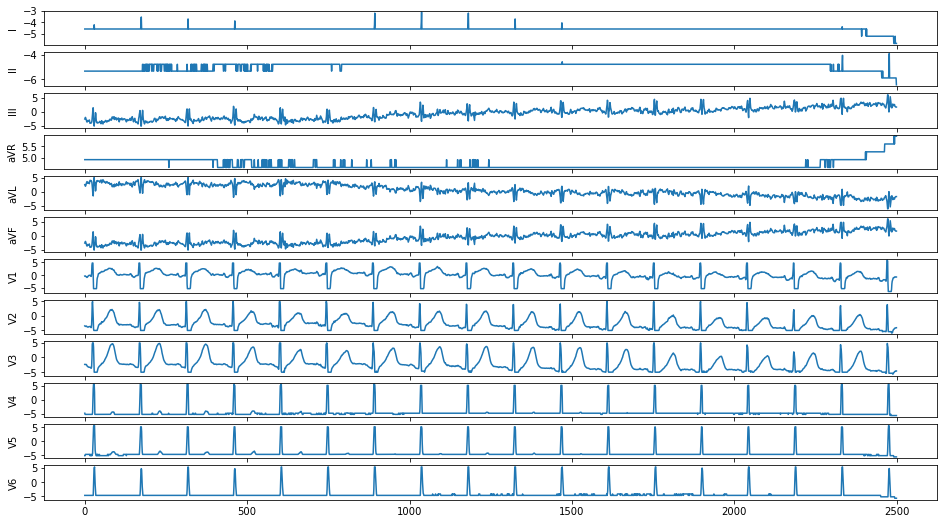

...

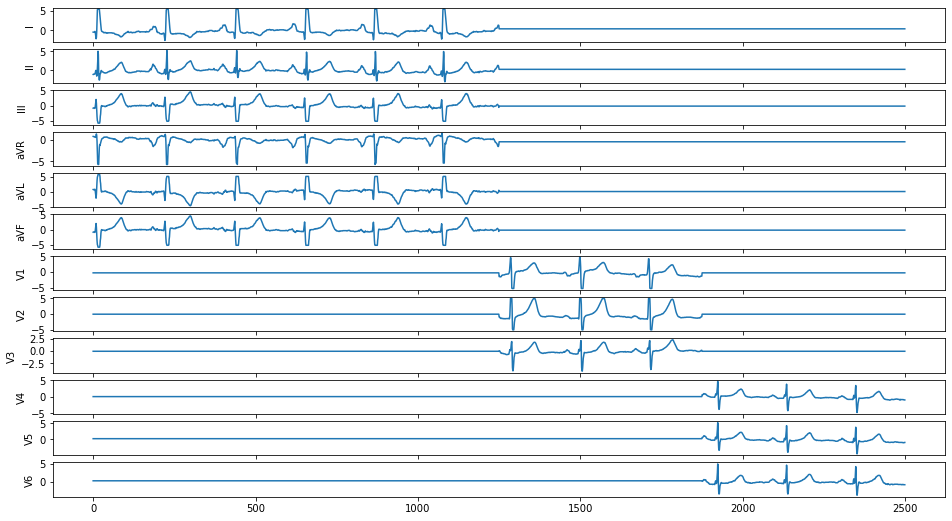

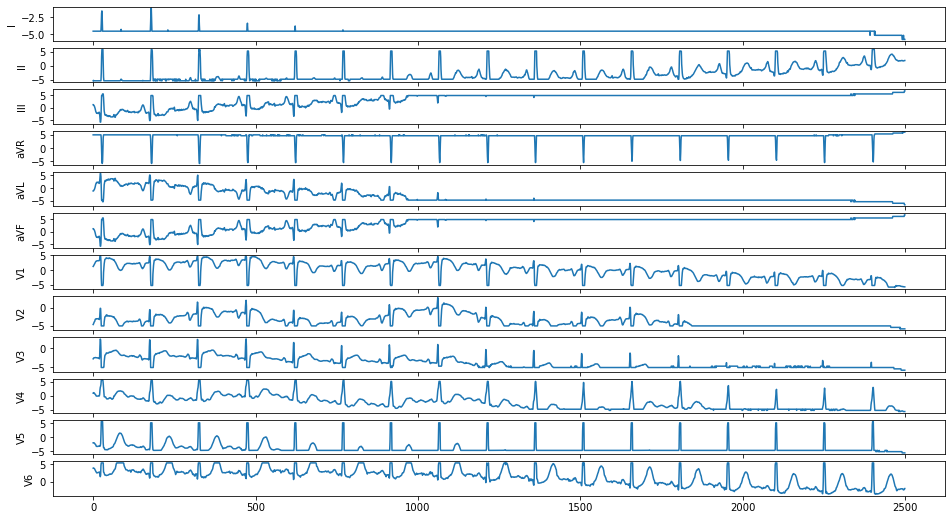

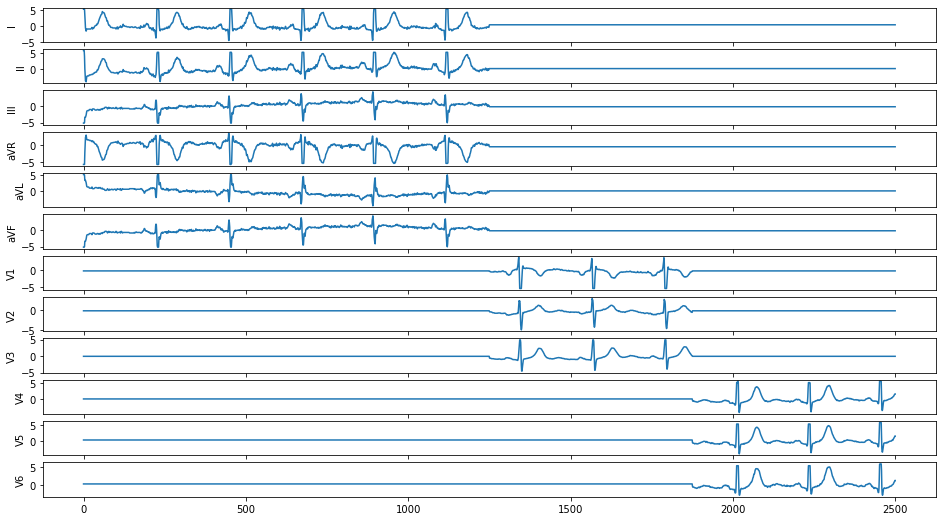

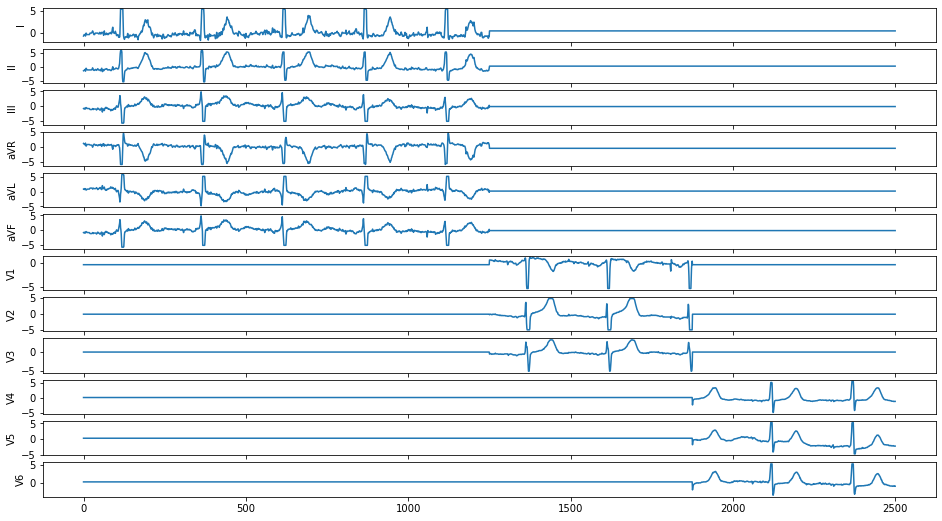

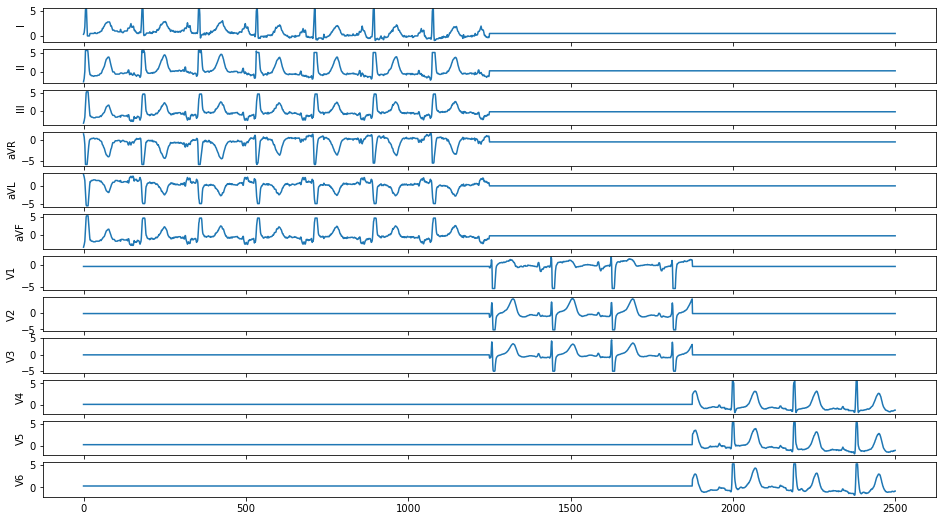

In [103]:
#Prove that the indices selected by find_flatlines are indeed all flatlines

lead_order = ['I', 'II', 'III', 'aVR', 'aVL', 'aVF', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6']
array = eval_array
labels  = eval_labels_flatline['stenosis_label_binary']
for j in np.array(eval_labels_flatline.index[0:20].astype(int)):
    plt.rcParams["figure.figsize"] = [16,9]
    fig, axs = plt.subplots(len(lead_order))
    a=j
    print("Label Value:",labels[a])
    if array.shape[1:3] == (2500, 12):
        for i in range(0,12):
            axs[i].plot(array[a][:,i])
            axs[i].set(ylabel=str(lead_order[i]))
    elif array.shape[1:3] == (12, 2500):
        for i in range(0,12):
            axs[i].plot(array[a][i,:])
            axs[i].set(ylabel=str(lead_order[i]))
    elif array.shape[1:] == (1,2500,12):
        for i in range(0,12):
            axs[i].plot(array[a][0][:,i])
            axs[i].set(ylabel=str(lead_order[i]))
    else:
        print("ECG shape not valid: ",array.shape)

In [105]:
#Determine how many more ecgs would be caught using 1200 rather than 2250
import time
start = time.time()
flatline_list_1200 = []
find_flatlines(eval_array,1200,flatline_list_1200)
end = time.time()
print(end - start)
print(len(flatline_list_1200))

0 ECGs converted
1000 ECGs converted
2000 ECGs converted
3000 ECGs converted
4000 ECGs converted
5000 ECGs converted
6000 ECGs converted
7000 ECGs converted
8000 ECGs converted
9000 ECGs converted
10000 ECGs converted
11000 ECGs converted
12000 ECGs converted
13000 ECGs converted
14000 ECGs converted
15000 ECGs converted
16000 ECGs converted
17000 ECGs converted
18000 ECGs converted
19000 ECGs converted
20000 ECGs converted
21000 ECGs converted
22000 ECGs converted
23000 ECGs converted
24000 ECGs converted
25000 ECGs converted
26000 ECGs converted
27000 ECGs converted
28000 ECGs converted
414.82528281211853
28647


In [109]:
sum(flatline_list_1200)

470

In [110]:
eval_labels['flatline_present_1200'] = flatline_list_1200

In [111]:
no_flatlines_1200 = np.array(eval_labels.index[eval_labels['flatline_present_1200'] == 0])
all_flatlines_1200 = np.array(eval_labels.index[eval_labels['flatline_present_1200'] == 1])
eval_labels_flatline_1200 = eval_labels[eval_labels['flatline_present_1200'] == 1]
eval_labels_no_flatline_1200 = eval_labels[eval_labels['flatline_present_1200'] == 0]

Label Value: 0
Label Value: 0
Label Value: 1
Label Value: 1
Label Value: 0
Label Value: 0
Label Value: 0
Label Value: 0
Label Value: 0
Label Value: 0
Label Value: 0
Label Value: 0
Label Value: 0
Label Value: 0
Label Value: 0
Label Value: 0
Label Value: 0
Label Value: 0
Label Value: 0
Label Value: 0


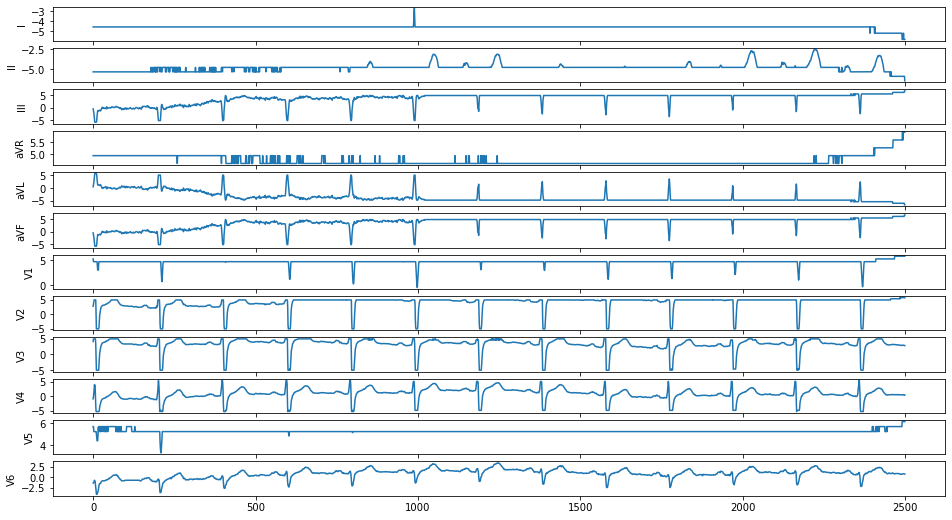

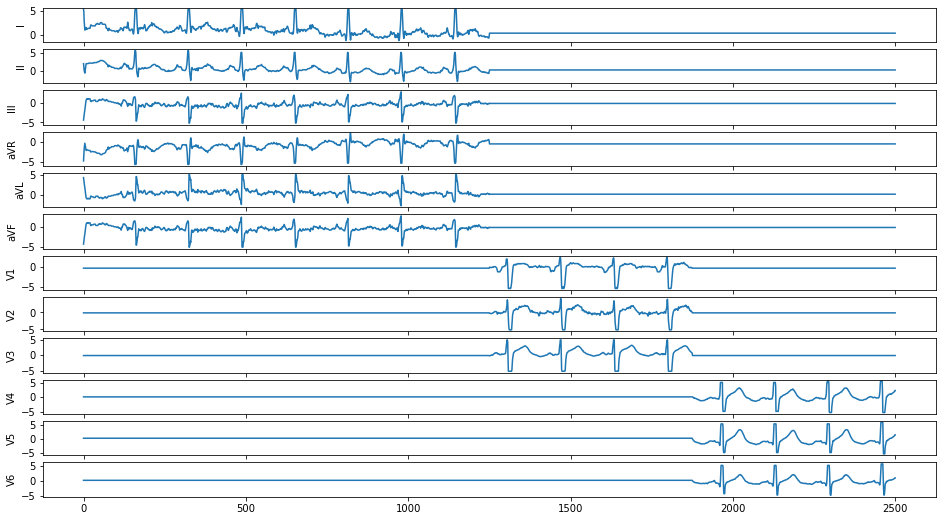

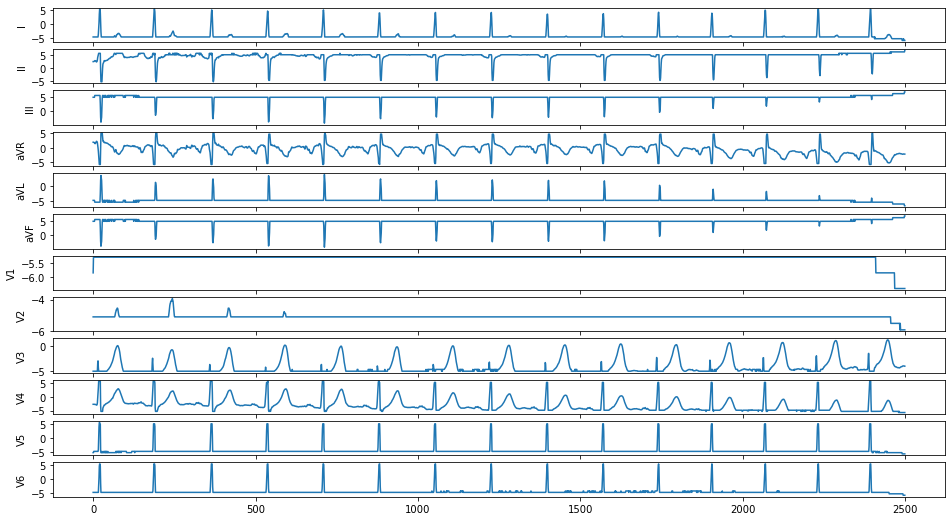

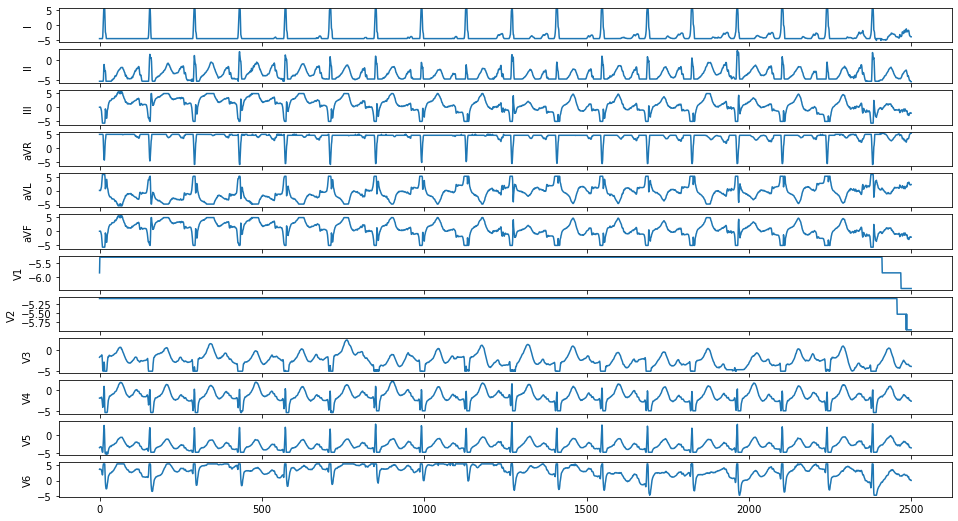

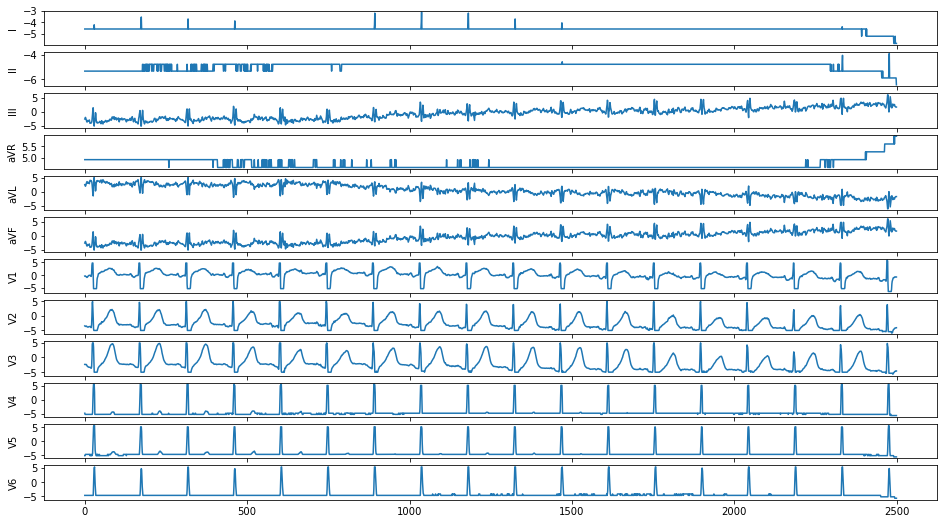

...

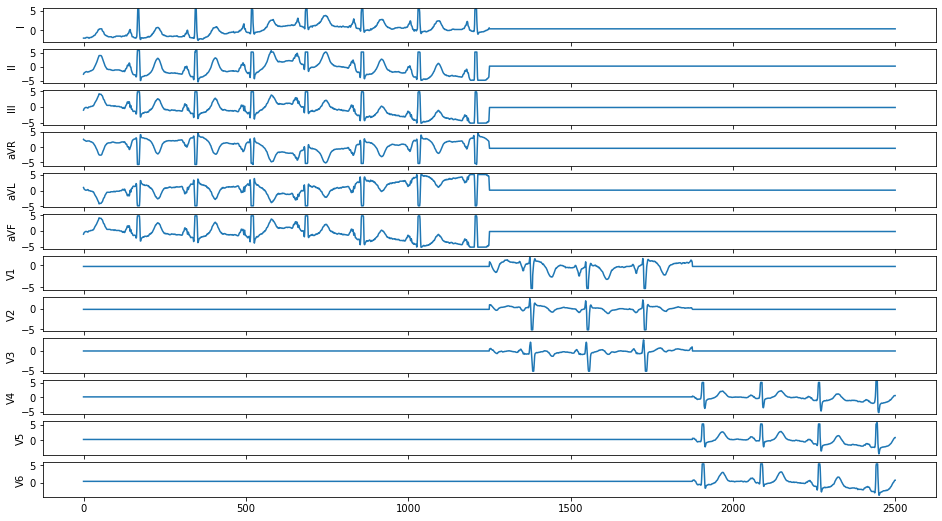

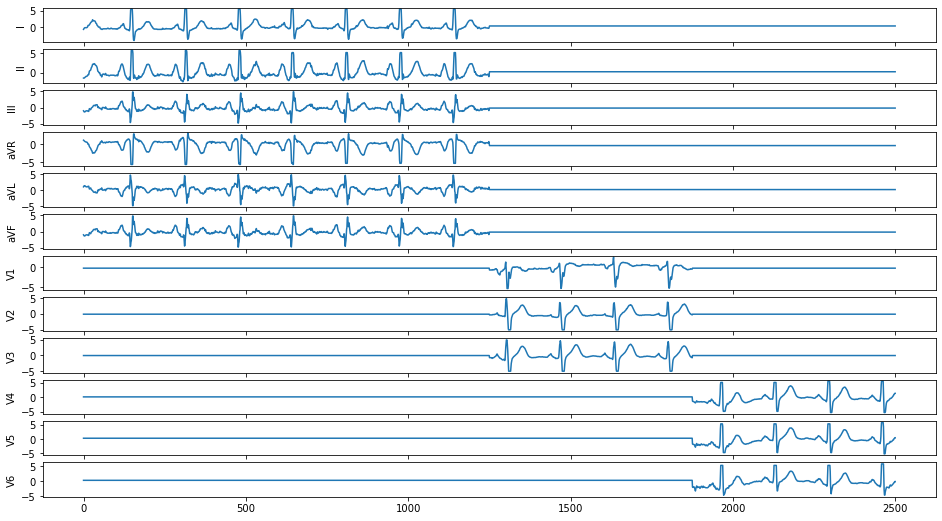

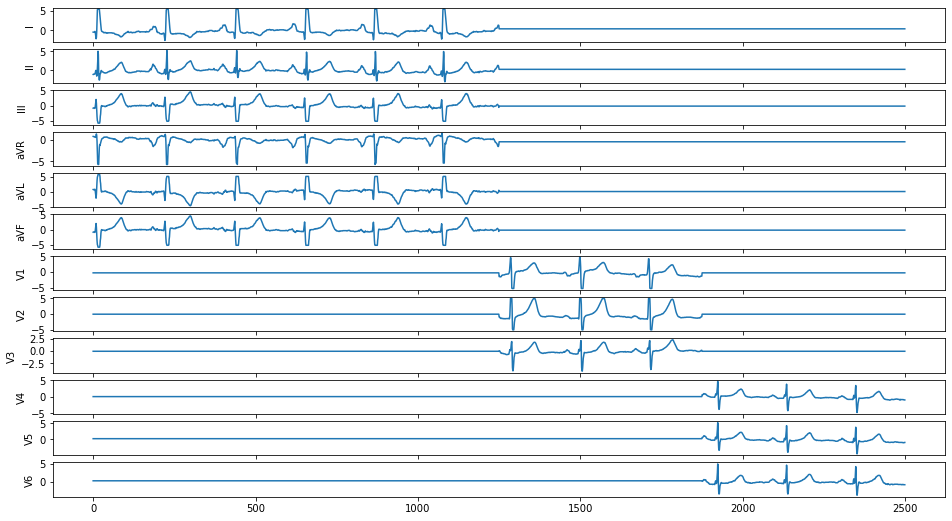

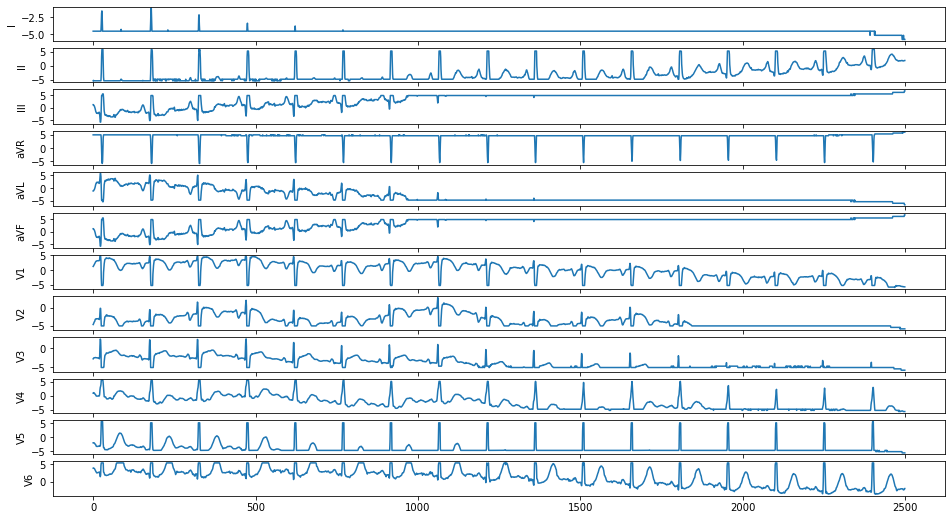

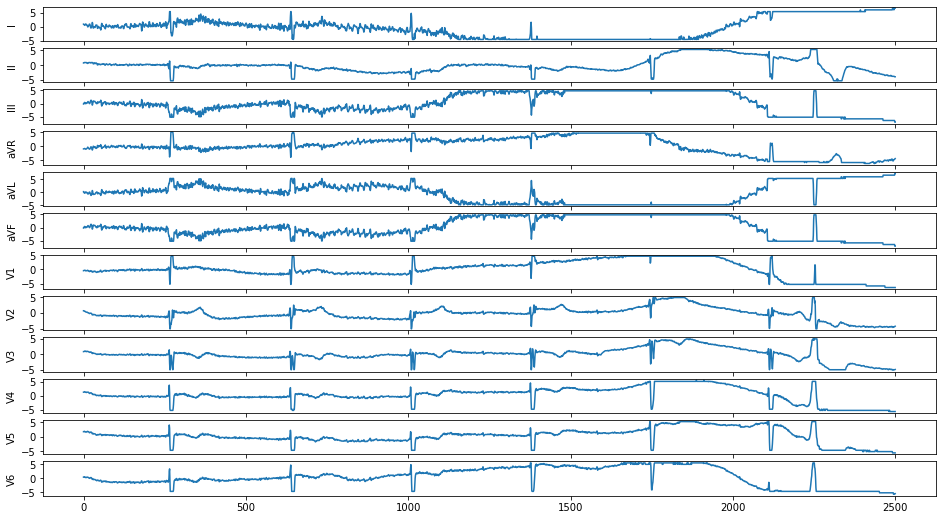

In [118]:
#Prove that the indices selected by find_flatlines are indeed all flatlines

lead_order = ['I', 'II', 'III', 'aVR', 'aVL', 'aVF', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6']
array = eval_array
labels  = eval_labels_flatline_1200['stenosis_label_binary']
for j in np.array(eval_labels_flatline_1200.index[0:20].astype(int)):
    plt.rcParams["figure.figsize"] = [16,9]
    fig, axs = plt.subplots(len(lead_order))
    a=j
    print("Label Value:",labels[a])
    if array.shape[1:3] == (2500, 12):
        for i in range(0,12):
            axs[i].plot(array[a][:,i])
            axs[i].set(ylabel=str(lead_order[i]))
    elif array.shape[1:3] == (12, 2500):
        for i in range(0,12):
            axs[i].plot(array[a][i,:])
            axs[i].set(ylabel=str(lead_order[i]))
    elif array.shape[1:] == (1,2500,12):
        for i in range(0,12):
            axs[i].plot(array[a][0][:,i])
            axs[i].set(ylabel=str(lead_order[i]))
    else:
        print("ECG shape not valid: ",array.shape)

In [113]:
#Determine how many more ecgs would be caught using 600 rather than 2250
import time
start = time.time()
flatline_list_600 = []
find_flatlines(eval_array,600,flatline_list_600)
end = time.time()
print(end - start)

sum(flatline_list_600)

0 ECGs converted
1000 ECGs converted
2000 ECGs converted
3000 ECGs converted
4000 ECGs converted
5000 ECGs converted
6000 ECGs converted
7000 ECGs converted
8000 ECGs converted
9000 ECGs converted
10000 ECGs converted
11000 ECGs converted
12000 ECGs converted
13000 ECGs converted
14000 ECGs converted
15000 ECGs converted
16000 ECGs converted
17000 ECGs converted
18000 ECGs converted
19000 ECGs converted
20000 ECGs converted
21000 ECGs converted
22000 ECGs converted
23000 ECGs converted
24000 ECGs converted
25000 ECGs converted
26000 ECGs converted
27000 ECGs converted
28000 ECGs converted
415.9205687046051


470

In [117]:
sum(flatline_list_600)

892

In [114]:
eval_labels['flatline_present_600'] = flatline_list_600

In [115]:
no_flatlines_600 = np.array(eval_labels.index[eval_labels['flatline_present_600'] == 0])
all_flatlines_600 = np.array(eval_labels.index[eval_labels['flatline_present_600'] == 1])
eval_labels_flatline_600 = eval_labels[eval_labels['flatline_present_600'] == 1]
eval_labels_no_flatline_600 = eval_labels[eval_labels['flatline_present_600'] == 0]

Label Value: 0
Label Value: 0
Label Value: 0
Label Value: 0
Label Value: 0
Label Value: 0
Label Value: 1
Label Value: 1
Label Value: 0
Label Value: 1
Label Value: 1
Label Value: 0
Label Value: 0
Label Value: 0
Label Value: 0
Label Value: 0
Label Value: 0
Label Value: 0
Label Value: 0
Label Value: 0


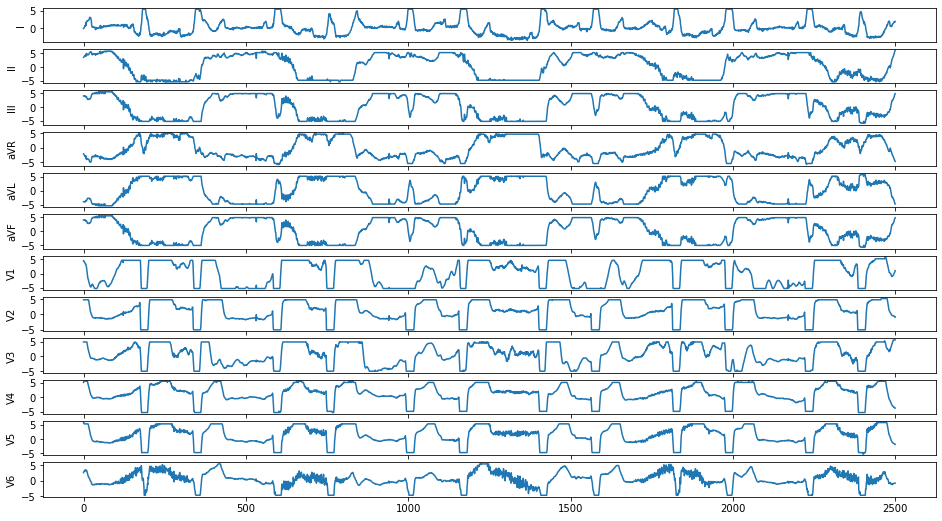

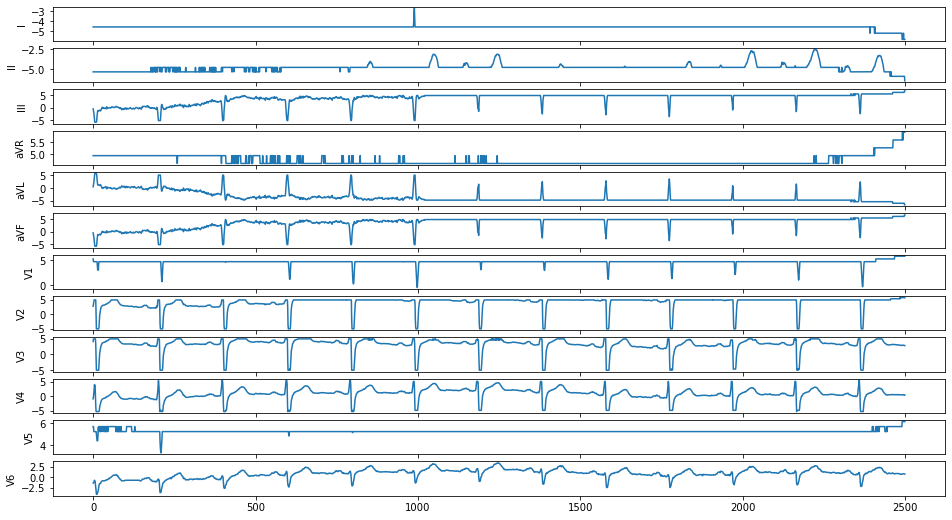

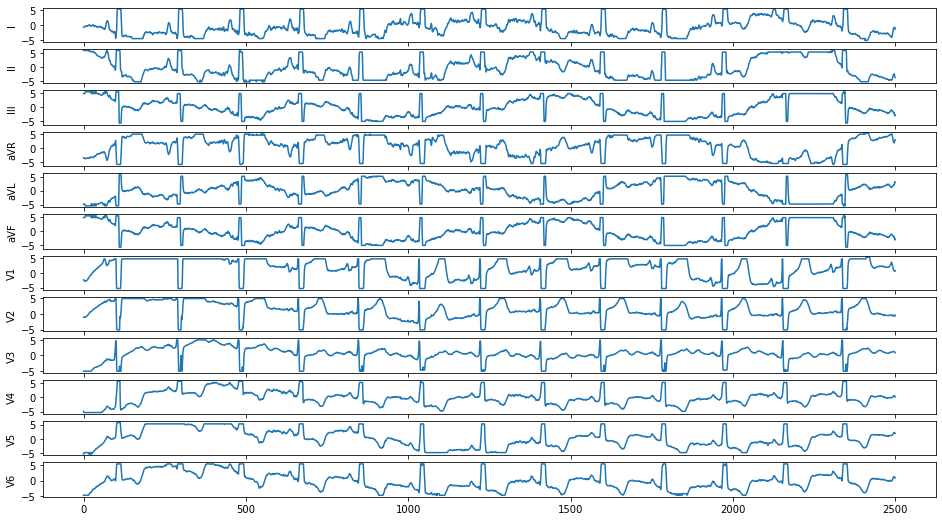

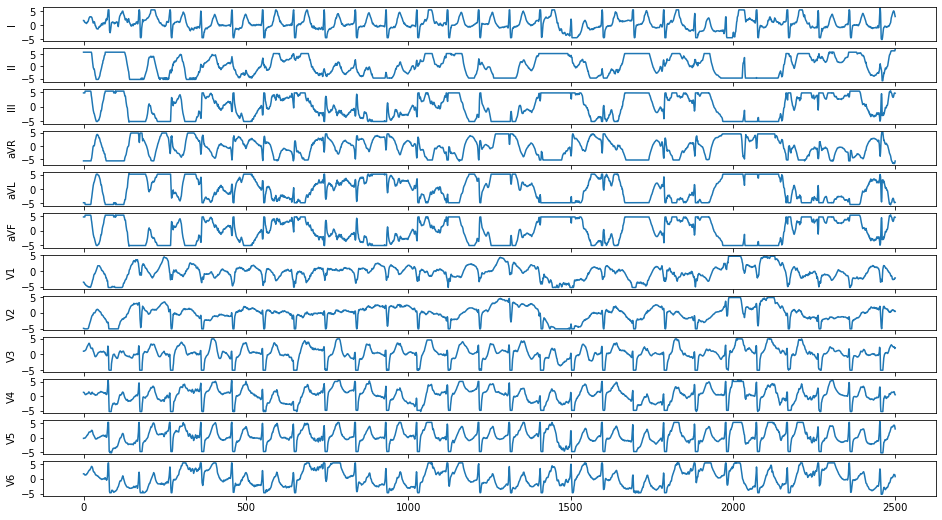

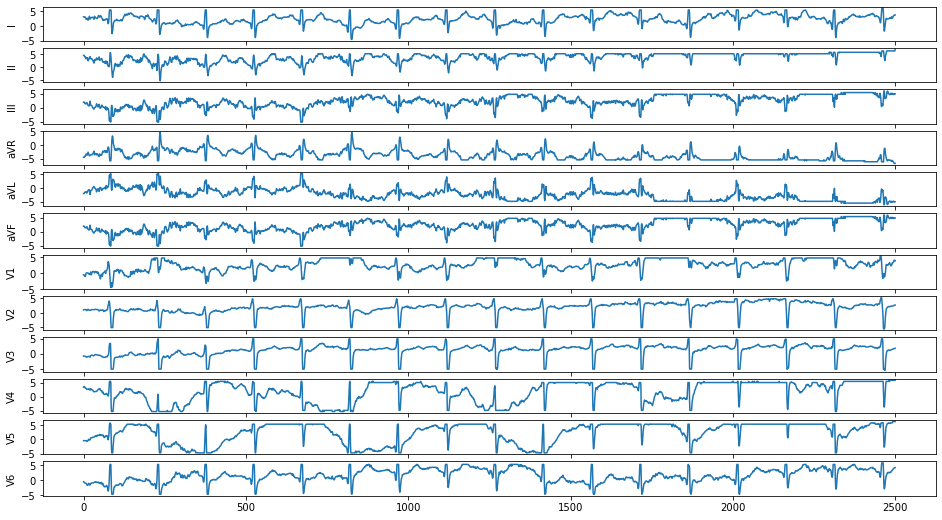

...

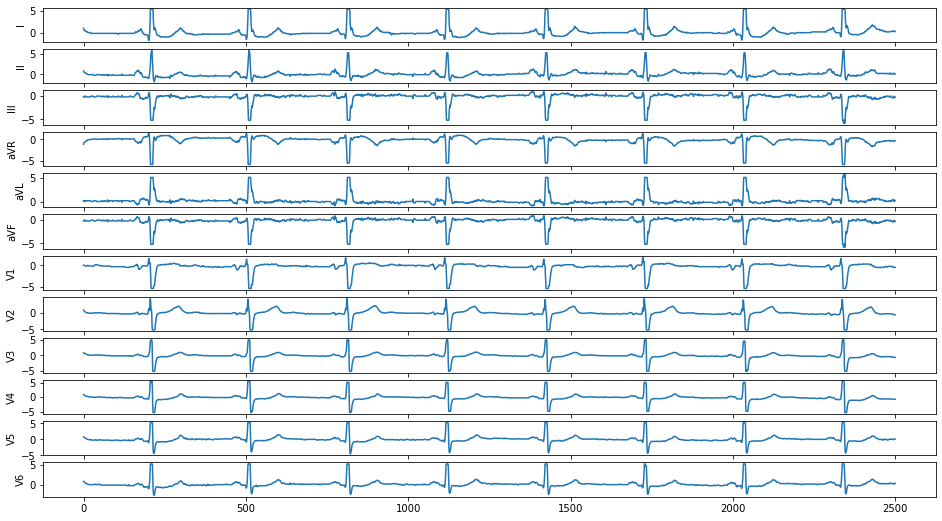

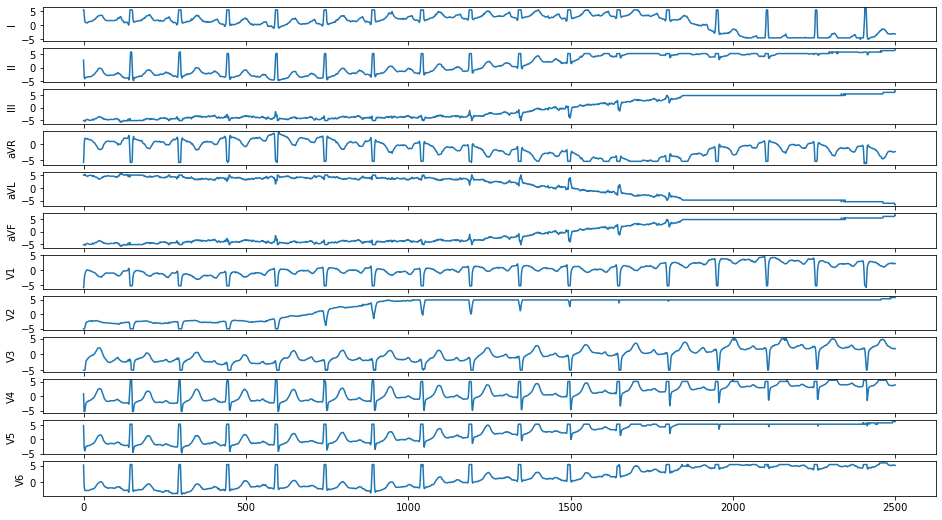

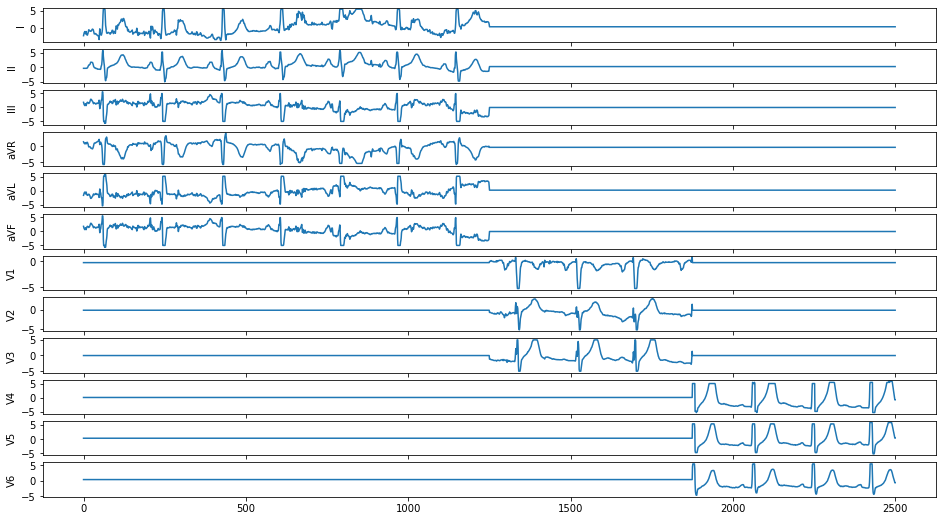

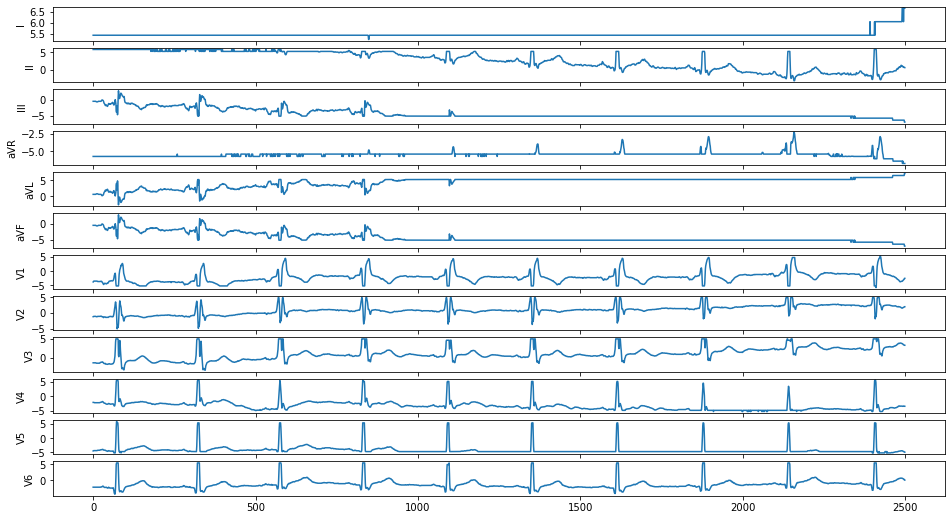

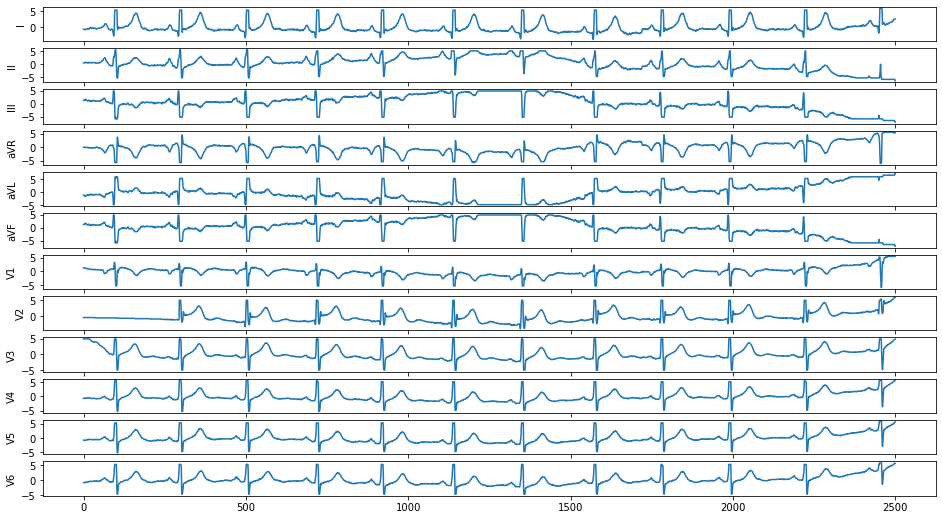

In [119]:
#Prove that the indices selected by find_flatlines are indeed all flatlines

lead_order = ['I', 'II', 'III', 'aVR', 'aVL', 'aVF', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6']
array = eval_array
labels  = eval_labels_flatline_600['stenosis_label_binary']
for j in np.array(eval_labels_flatline_600.index[0:20].astype(int)):
    plt.rcParams["figure.figsize"] = [16,9]
    fig, axs = plt.subplots(len(lead_order))
    a=j
    print("Label Value:",labels[a])
    if array.shape[1:3] == (2500, 12):
        for i in range(0,12):
            axs[i].plot(array[a][:,i])
            axs[i].set(ylabel=str(lead_order[i]))
    elif array.shape[1:3] == (12, 2500):
        for i in range(0,12):
            axs[i].plot(array[a][i,:])
            axs[i].set(ylabel=str(lead_order[i]))
    elif array.shape[1:] == (1,2500,12):
        for i in range(0,12):
            axs[i].plot(array[a][0][:,i])
            axs[i].set(ylabel=str(lead_order[i]))
    else:
        print("ECG shape not valid: ",array.shape)

In [121]:
eval_labels_no_flatline_600.to_csv('/data/ValveNet/29k_eval_df_pace_removed_poor_quality_removed_any_patient_negative_as_tabular_metadata_DEIDENTIFIED_SHUFFLED_flatlines_removed.csv',\
                                        index=False)



In [122]:
cd /data/ValveNet/

/data/ValveNet


In [123]:
filenames = ['29k_eval_df_pace_removed_poor_quality_removed_any_patient_negative_as_tabular_metadata_SHUFFLED',
'29k_eval_df_pace_removed_poor_quality_removed_any_patient_negative_as_tabular_expanded_standardscaler_SHUFFLED',
'29k_eval_df_pace_removed_poor_quality_removed_any_patient_negative_as_labels_SHUFFLED',
'29k_eval_df_pace_removed_poor_quality_removed_any_patient_negative_as_features_unprocessed_SHUFFLED',
'29k_eval_df_pace_removed_poor_quality_removed_any_patient_negative_as_features_5_sigma_robust_normalization_SHUFFLED',
'29k_eval_df_pace_removed_poor_quality_removed_any_patient_negative_as_features_5_sigma_robust_normalization_rolling_avg_5_SHUFFLED',
            ]


In [126]:
for file in filenames:
    array=np.load(file+".npy")
    array=array[no_flatlines_600]
    print(array.shape)
    np.save(file+"_flatlines_removed.npy",array)

(27755, 2500, 12, 1)
(27755, 64)
(27755,)
(27755, 1, 2500, 12)
(27755, 1, 2500, 12)
(27755, 1, 2500, 12)


In [125]:
eval_array.shape

(28647, 1, 2500, 12)

In [127]:
len(eval_array)-len(eval_array[no_flatlines_600])==sum(flatline_list_600)

True

In [129]:
#Determine how many more ecgs would be caught using 600 rather than 2250
import time
start = time.time()
flatline_list_600 = []
find_flatlines(train_array,600,flatline_list_600)
end = time.time()
print(end - start)

sum(flatline_list_600)

0 ECGs converted
1000 ECGs converted
2000 ECGs converted
3000 ECGs converted
4000 ECGs converted
5000 ECGs converted
6000 ECGs converted
7000 ECGs converted
8000 ECGs converted
9000 ECGs converted
10000 ECGs converted
11000 ECGs converted
12000 ECGs converted
13000 ECGs converted
14000 ECGs converted
15000 ECGs converted
16000 ECGs converted
17000 ECGs converted
18000 ECGs converted
19000 ECGs converted
20000 ECGs converted
21000 ECGs converted
22000 ECGs converted
23000 ECGs converted
24000 ECGs converted
25000 ECGs converted
26000 ECGs converted
27000 ECGs converted
28000 ECGs converted
29000 ECGs converted
30000 ECGs converted
31000 ECGs converted
32000 ECGs converted
33000 ECGs converted
34000 ECGs converted
35000 ECGs converted
36000 ECGs converted
37000 ECGs converted
38000 ECGs converted
39000 ECGs converted
40000 ECGs converted
41000 ECGs converted
42000 ECGs converted
43000 ECGs converted
44000 ECGs converted
45000 ECGs converted
46000 ECGs converted
47000 ECGs converted
48000

1574

In [130]:
sum(flatline_list_600)

1574

In [131]:
train_labels['flatline_present_600'] = flatline_list_600

In [132]:
no_flatlines_600 = np.array(train_labels.index[train_labels['flatline_present_600'] == 0])
all_flatlines_600 = np.array(train_labels.index[train_labels['flatline_present_600'] == 1])
train_labels_flatline_600 = train_labels[train_labels['flatline_present_600'] == 1]
train_labels_no_flatline_600 = train_labels[train_labels['flatline_present_600'] == 0]

Label Value: 1
Label Value: 1
Label Value: 1
Label Value: 1
Label Value: 1
Label Value: 0
Label Value: 1
Label Value: 0
Label Value: 1
Label Value: 1
Label Value: 1
Label Value: 0
Label Value: 1
Label Value: 0
Label Value: 0
Label Value: 1
Label Value: 0
Label Value: 0
Label Value: 0
Label Value: 0


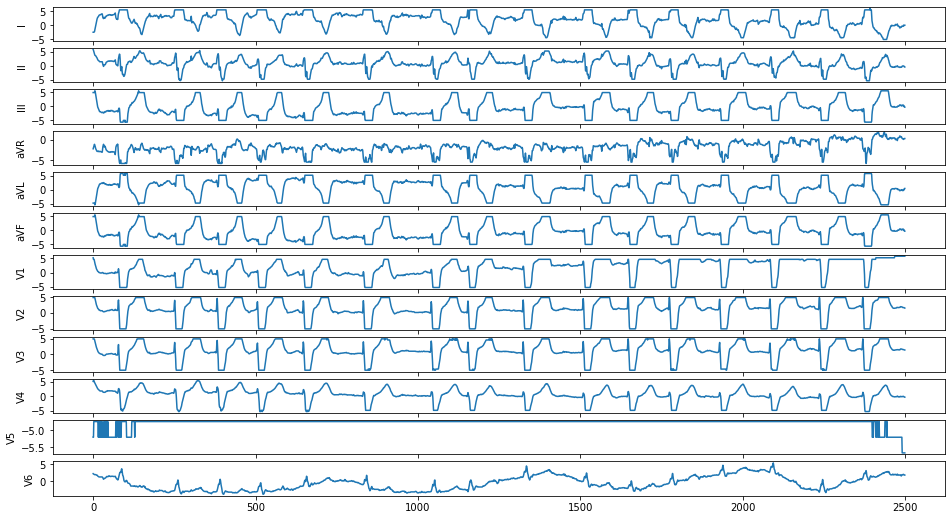

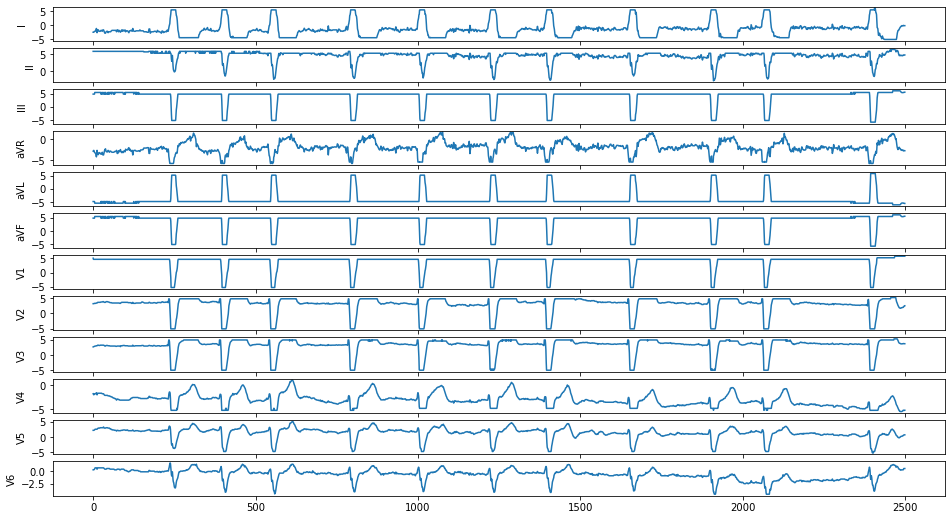

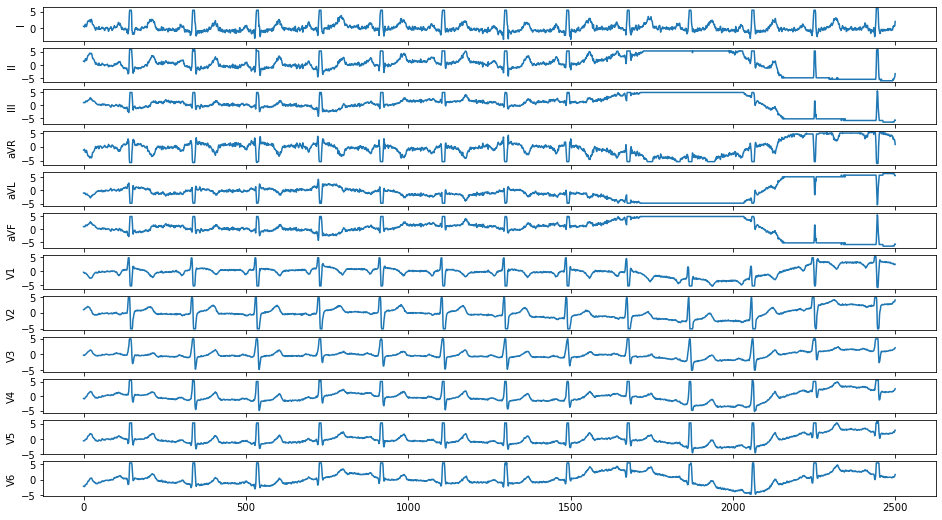

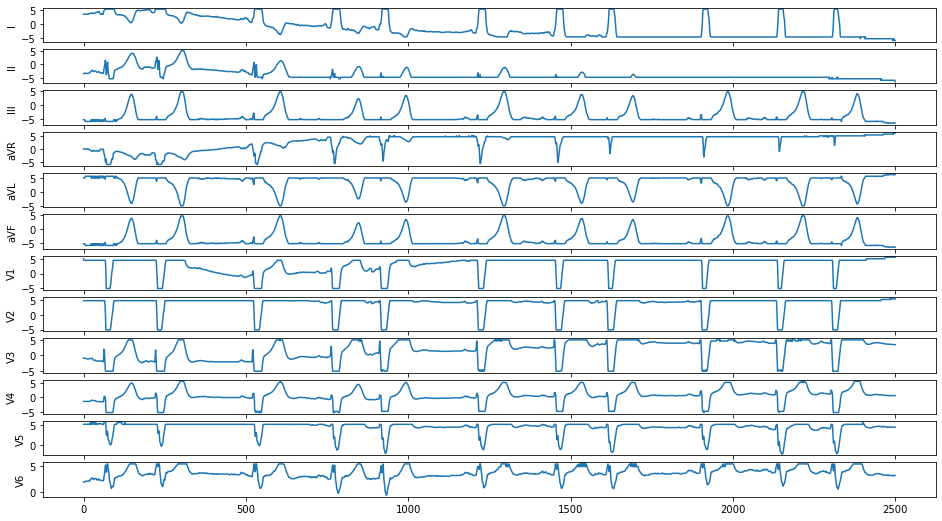

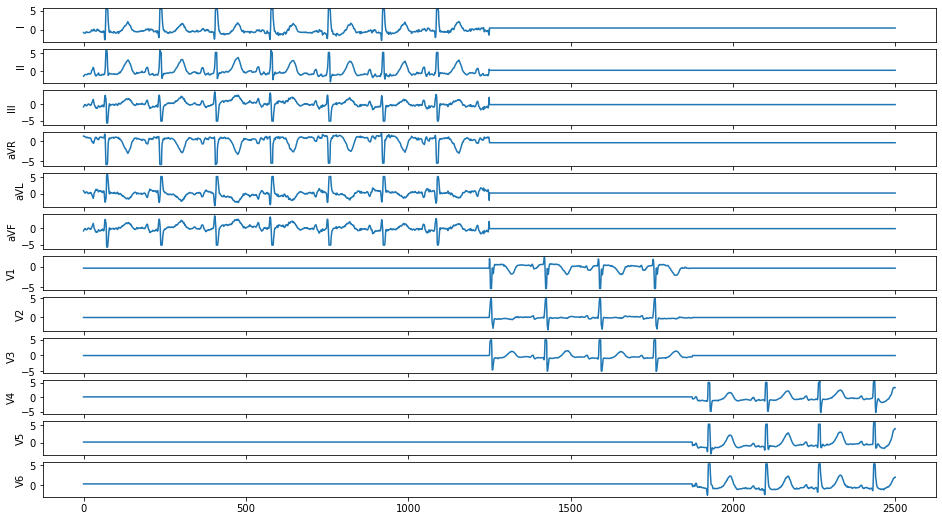

...

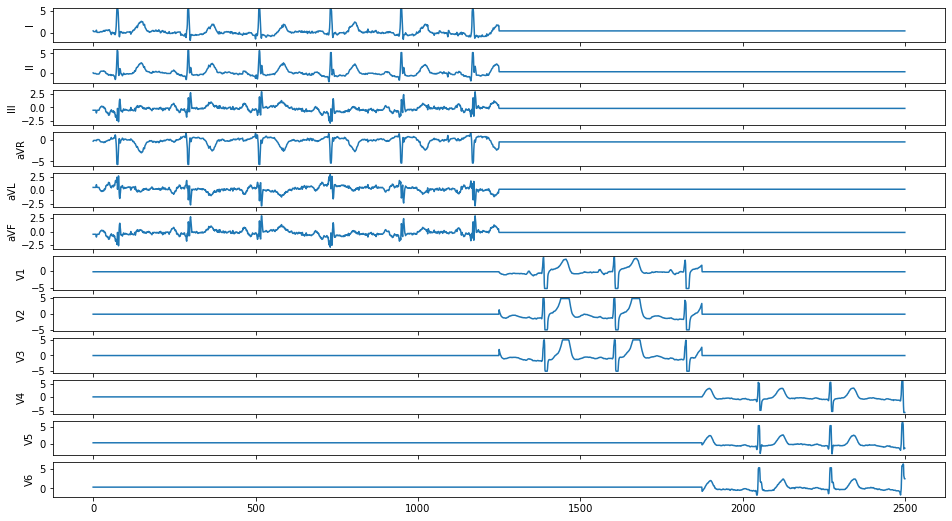

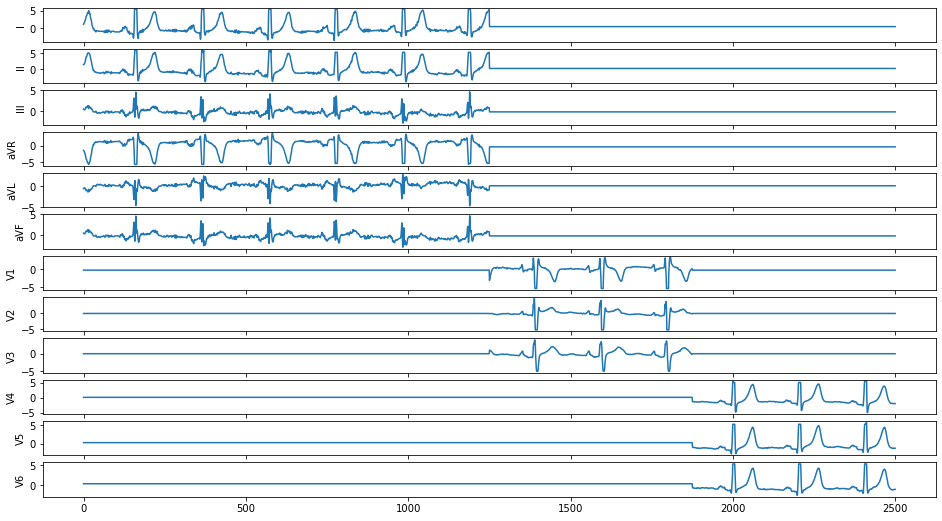

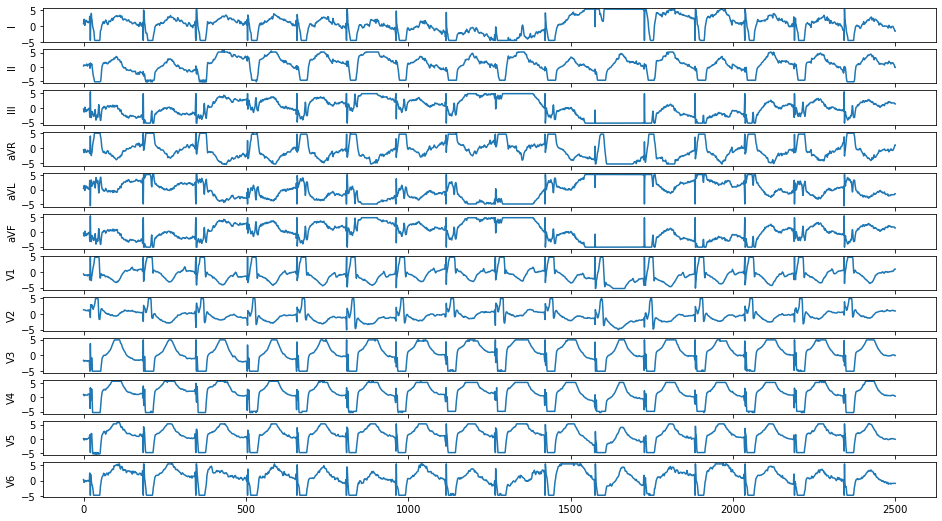

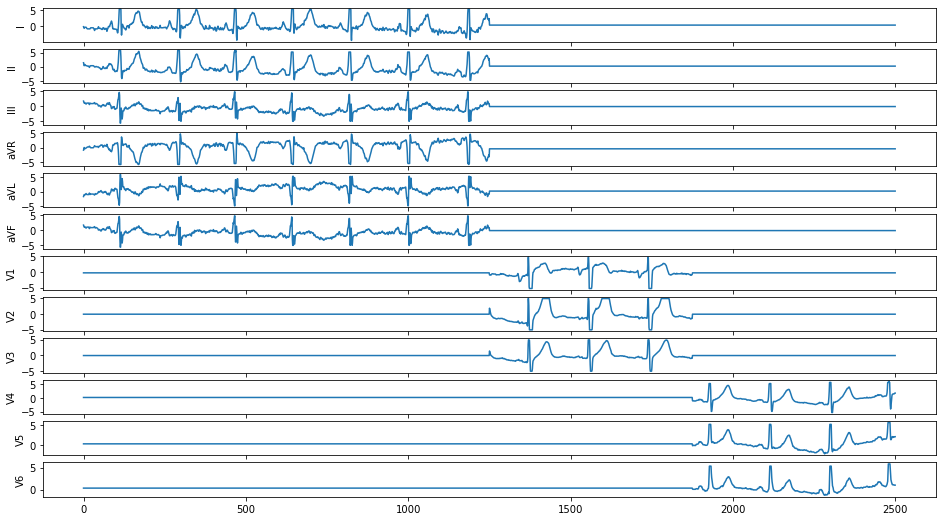

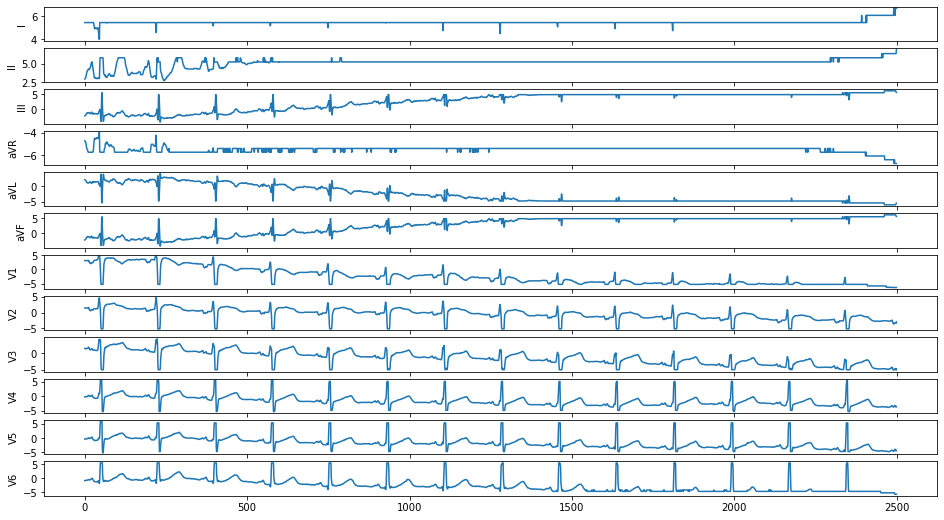

In [133]:
#Prove that the indices selected by find_flatlines are indeed all flatlines

lead_order = ['I', 'II', 'III', 'aVR', 'aVL', 'aVF', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6']
array = train_array
labels  = train_labels_flatline_600['stenosis_label_binary']
for j in np.array(train_labels_flatline_600.index[0:20].astype(int)):
    plt.rcParams["figure.figsize"] = [16,9]
    fig, axs = plt.subplots(len(lead_order))
    a=j
    print("Label Value:",labels[a])
    if array.shape[1:3] == (2500, 12):
        for i in range(0,12):
            axs[i].plot(array[a][:,i])
            axs[i].set(ylabel=str(lead_order[i]))
    elif array.shape[1:3] == (12, 2500):
        for i in range(0,12):
            axs[i].plot(array[a][i,:])
            axs[i].set(ylabel=str(lead_order[i]))
    elif array.shape[1:] == (1,2500,12):
        for i in range(0,12):
            axs[i].plot(array[a][0][:,i])
            axs[i].set(ylabel=str(lead_order[i]))
    else:
        print("ECG shape not valid: ",array.shape)

In [134]:
train_labels_no_flatline_600.to_csv('/data/ValveNet/57k_train_df_pace_removed_poor_quality_removed_any_patient_negative_as_tabular_metadata_DEIDENTIFIED_flatlines_removed.csv',\
                                        index=False)



In [135]:
cd /data/ValveNet/

/data/ValveNet


In [136]:
filenames = ['57k_train_df_pace_removed_poor_quality_removed_any_patient_negative_as_tabular_metadata',
'57k_train_df_pace_removed_poor_quality_removed_any_patient_negative_as_tabular_expanded_standardscaler',
'57k_train_df_pace_removed_poor_quality_removed_any_patient_negative_as_labels',
'57k_train_df_pace_removed_poor_quality_removed_any_patient_negative_as_features_unprocessed',
'57k_train_df_pace_removed_poor_quality_removed_any_patient_negative_as_features_5_sigma_robust_normalization',
'57k_train_df_pace_removed_poor_quality_removed_any_patient_negative_as_features_5_sigma_robust_normalization_rolling_avg_5',
            ]


In [137]:
for file in filenames:
    array=np.load(file+".npy")
    array=array[no_flatlines_600]
    print(array.shape)
    np.save(file+"_flatlines_removed.npy",array)

(55519, 2500, 12, 1)
(55519, 64)
(55519,)
(55519, 1, 2500, 12)
(55519, 1, 2500, 12)
(55519, 1, 2500, 12)


In [138]:
train_array.shape

(57093, 1, 2500, 12)

In [139]:
len(train_array)-len(train_array[no_flatlines_600])==sum(flatline_list_600)

True